In [161]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/birdcall-check/test.csv
/kaggle/input/birdcall-check/test_audio/8680a8dd845d40f296246dbed0d37394.mp3
/kaggle/input/birdcall-check/test_audio/a56e20a518684688a9952add8a9d5213.mp3
/kaggle/input/birdcall-check/test_audio/b2fd3f01e9284293a1e33f9c811a2ed6.mp3
/kaggle/input/birdcall-check/test_audio/41e6fe6504a34bf6846938ba78d13df1.mp3
/kaggle/input/birdcall-check/test_audio/cce64fffafed40f2b2f3d3413ec1c4c2.mp3
/kaggle/input/birdcall-check/test_audio/899616723a32409c996f6f3441646c2a.mp3
/kaggle/input/birdcall-check/test_audio/96779836288745728306903d54e264dd.mp3
/kaggle/input/birdcall-check/test_audio/6ab74e177aa149468a39ca10beed6222.mp3
/kaggle/input/birdcall-check/test_audio/de62b37ebba749d2abf29d4a493ea5d4.mp3
/kaggle/input/birdcall-check/test_audio/99af324c881246949408c0b1ae54271f.mp3
/kaggle/input/birdcall-check/test_audio/f77783ba4c6641bc918b034a18c23e53.mp3
/kaggle/input/birdcall-check/test_audio/940d546e5eb745c9a74bce3f35efa1f9.mp3
/kaggle/input/birdcall-check/test_audi

In [162]:
import cv2
import audioread
import logging
import os
import random
import time
import warnings

import librosa
import numpy as np
import pandas as pd
import soundfile as sf
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data

from contextlib import contextmanager
from pathlib import Path
from typing import Optional

from fastprogress import progress_bar
from sklearn.metrics import f1_score
from torchvision import models

In [163]:
Train = pd.read_csv('/kaggle/input/birdsong-recognition/train.csv')
Train

,rating,playback_used,ebird_code,channels,date,pitch,duration,filename,speed,species,number_of_notes,title,secondary_labels,bird_seen,sci_name,location,latitude,sampling_rate,type,elevation,description,bitrate_of_mp3,file_type,volume,background,xc_id,url,country,author,primary_label,longitude,length,time,recordist,license
0,3.5,no,aldfly,1 (mono),2013-05-25,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,Not specified,XC134874 Alder Flycatcher (Empidonax alnorum),"['Empidonax minimus_Least Flycatcher', 'Leioth...",yes,Empidonax alnorum,"Grey Cloud Dunes SNA, Washington, Minnesota",44.793,48000 (Hz),call,220 m,Two short segments of fairly quiet *pip* calls...,192000 (bps),mp3,Not specified,American Yellow Warbler (Setophaga aestiva); L...,134874,https://www.xeno-canto.org/134874,United States,Jonathon Jongsma,Empidonax alnorum_Alder Flycatcher,-92.962,Not specified,8:00,Jonathon Jongsma,Creative Commons Attribution-ShareAlike 3.0
1,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135454.mp3,both,Alder Flycatcher,1-3,XC135454 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,At least three birds seen here moving around s...,128000 (bps),mp3,level,NaN,135454,https://www.xeno-canto.org/135454,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
2,4.0,no,aldfly,2 (stereo),2013-05-27,both,39,XC135455.mp3,both,Alder Flycatcher,1-3,XC135455 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,At least three birds seen chasing each other a...,128000 (bps),mp3,level,NaN,135455,https://www.xeno-canto.org/135455,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
3,3.5,no,aldfly,2 (stereo),2013-05-27,both,33,XC135456.mp3,both,Alder Flycatcher,1-3,XC135456 Alder Flycatcher (Empidonax alnorum),"['Dumetella carolinensis_Gray Catbird', 'Bomby...",yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,Grey Catbird (Dumetella carolinensis); Cedar W...,135456,https://www.xeno-canto.org/135456,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
4,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135457.mp3,level,Alder Flycatcher,1-3,XC135457 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,NaN,135457,https://www.xeno-canto.org/135457,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21370,4.5,no,yetvir,1 (mono),2019-05-15,both,28,XC477608.mp3,level,Yellow-throated Vireo,4-6,XC477608 Yellow-throated Vireo (Vireo flavifrons),"['Dryobates pubescens_Downy Woodpecker', 'Poli...",yes,Vireo flavifrons,"Spring Valley (near Waynesville), Greene Cty...",39.5734,48000 (Hz),song,220 m,Natural vocalization,192000 (bps),mp3,both,Downy Woodpecker (Dryobates pubescens); Blue-g...,477608,https://www.xeno-canto.org/477608,United States,Sue Riffe,Vireo flavifrons_Yellow-throated Vireo,-84.0131,0-3(s),13:00,Sue Riffe,Creative Commons Attribution-NonCommercial-Sha...
21371,3.5,no,yetvir,1 (mono),2017-05-14,Not specified,52,XC500348.mp3,Not specified,Yellow-throated Vireo,Not specified,XC500348 Yellow-throated Vireo (Vireo flavifrons),"['Vireo olivaceus_Red-

In [164]:
Train.shape

(21375, 35)

In [165]:
pd.set_option('display.max_columns',None)
pd.set_option('display.expand_frame_repr',False)


In [166]:
Train

,rating,playback_used,ebird_code,channels,date,pitch,duration,filename,speed,species,number_of_notes,title,secondary_labels,bird_seen,sci_name,location,latitude,sampling_rate,type,elevation,description,bitrate_of_mp3,file_type,volume,background,xc_id,url,country,author,primary_label,longitude,length,time,recordist,license
0,3.5,no,aldfly,1 (mono),2013-05-25,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,Not specified,XC134874 Alder Flycatcher (Empidonax alnorum),"['Empidonax minimus_Least Flycatcher', 'Leioth...",yes,Empidonax alnorum,"Grey Cloud Dunes SNA, Washington, Minnesota",44.793,48000 (Hz),call,220 m,Two short segments of fairly quiet *pip* calls...,192000 (bps),mp3,Not specified,American Yellow Warbler (Setophaga aestiva); L...,134874,https://www.xeno-canto.org/134874,United States,Jonathon Jongsma,Empidonax alnorum_Alder Flycatcher,-92.962,Not specified,8:00,Jonathon Jongsma,Creative Commons Attribution-ShareAlike 3.0
1,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135454.mp3,both,Alder Flycatcher,1-3,XC135454 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,At least three birds seen here moving around s...,128000 (bps),mp3,level,NaN,135454,https://www.xeno-canto.org/135454,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
2,4.0,no,aldfly,2 (stereo),2013-05-27,both,39,XC135455.mp3,both,Alder Flycatcher,1-3,XC135455 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,At least three birds seen chasing each other a...,128000 (bps),mp3,level,NaN,135455,https://www.xeno-canto.org/135455,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
3,3.5,no,aldfly,2 (stereo),2013-05-27,both,33,XC135456.mp3,both,Alder Flycatcher,1-3,XC135456 Alder Flycatcher (Empidonax alnorum),"['Dumetella carolinensis_Gray Catbird', 'Bomby...",yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,Grey Catbird (Dumetella carolinensis); Cedar W...,135456,https://www.xeno-canto.org/135456,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
4,4.0,no,aldfly,2 (stereo),2013-05-27,both,36,XC135457.mp3,level,Alder Flycatcher,1-3,XC135457 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,NaN,135457,https://www.xeno-canto.org/135457,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21370,4.5,no,yetvir,1 (mono),2019-05-15,both,28,XC477608.mp3,level,Yellow-throated Vireo,4-6,XC477608 Yellow-throated Vireo (Vireo flavifrons),"['Dryobates pubescens_Downy Woodpecker', 'Poli...",yes,Vireo flavifrons,"Spring Valley (near Waynesville), Greene Cty...",39.5734,48000 (Hz),song,220 m,Natural vocalization,192000 (bps),mp3,both,Downy Woodpecker (Dryobates pubescens); Blue-g...,477608,https://www.xeno-canto.org/477608,United States,Sue Riffe,Vireo flavifrons_Yellow-throated Vireo,-84.0131,0-3(s),13:00,Sue Riffe,Creative Commons Attribution-NonCommercial-Sha...
21371,3.5,no,yetvir,1 (mono),2017-05-14,Not specified,52,XC500348.mp3,Not specified,Yellow-throated Vireo,Not specified,XC500348 Yellow-throated Vireo (Vireo flavifrons),"['Vireo olivaceus_Red-

In [167]:
Train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21375 entries, 0 to 21374
Data columns (total 35 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   rating            21375 non-null  float64
 1   playback_used     19575 non-null  object 
 2   ebird_code        21375 non-null  object 
 3   channels          21375 non-null  object 
 4   date              21375 non-null  object 
 5   pitch             21375 non-null  object 
 6   duration          21375 non-null  int64  
 7   filename          21375 non-null  object 
 8   speed             21375 non-null  object 
 9   species           21375 non-null  object 
 10  number_of_notes   21375 non-null  object 
 11  title             21375 non-null  object 
 12  secondary_labels  21375 non-null  object 
 13  bird_seen         19575 non-null  object 
 14  sci_name          21375 non-null  object 
 15  location          21375 non-null  object 
 16  latitude          21375 non-null  object

In [168]:
print(Train.columns[Train.isnull().any()])

Index(['playback_used', 'bird_seen', 'description', 'bitrate_of_mp3',
       'background'],
      dtype='object')


In [169]:
Train['playback_used'].fillna('no',inplace=True)

In [170]:
Train['playback_used'].value_counts()

playback_used
no     20764
yes      611
Name: count, dtype: int64

In [171]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
Train['playback_used']=le.fit_transform(Train['playback_used'])

In [172]:
Train

,rating,playback_used,ebird_code,channels,date,pitch,duration,filename,speed,species,number_of_notes,title,secondary_labels,bird_seen,sci_name,location,latitude,sampling_rate,type,elevation,description,bitrate_of_mp3,file_type,volume,background,xc_id,url,country,author,primary_label,longitude,length,time,recordist,license
0,3.5,0,aldfly,1 (mono),2013-05-25,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,Not specified,XC134874 Alder Flycatcher (Empidonax alnorum),"['Empidonax minimus_Least Flycatcher', 'Leioth...",yes,Empidonax alnorum,"Grey Cloud Dunes SNA, Washington, Minnesota",44.793,48000 (Hz),call,220 m,Two short segments of fairly quiet *pip* calls...,192000 (bps),mp3,Not specified,American Yellow Warbler (Setophaga aestiva); L...,134874,https://www.xeno-canto.org/134874,United States,Jonathon Jongsma,Empidonax alnorum_Alder Flycatcher,-92.962,Not specified,8:00,Jonathon Jongsma,Creative Commons Attribution-ShareAlike 3.0
1,4.0,0,aldfly,2 (stereo),2013-05-27,both,36,XC135454.mp3,both,Alder Flycatcher,1-3,XC135454 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,At least three birds seen here moving around s...,128000 (bps),mp3,level,NaN,135454,https://www.xeno-canto.org/135454,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
2,4.0,0,aldfly,2 (stereo),2013-05-27,both,39,XC135455.mp3,both,Alder Flycatcher,1-3,XC135455 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,At least three birds seen chasing each other a...,128000 (bps),mp3,level,NaN,135455,https://www.xeno-canto.org/135455,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
3,3.5,0,aldfly,2 (stereo),2013-05-27,both,33,XC135456.mp3,both,Alder Flycatcher,1-3,XC135456 Alder Flycatcher (Empidonax alnorum),"['Dumetella carolinensis_Gray Catbird', 'Bomby...",yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,Grey Catbird (Dumetella carolinensis); Cedar W...,135456,https://www.xeno-canto.org/135456,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
4,4.0,0,aldfly,2 (stereo),2013-05-27,both,36,XC135457.mp3,level,Alder Flycatcher,1-3,XC135457 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,NaN,135457,https://www.xeno-canto.org/135457,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21370,4.5,0,yetvir,1 (mono),2019-05-15,both,28,XC477608.mp3,level,Yellow-throated Vireo,4-6,XC477608 Yellow-throated Vireo (Vireo flavifrons),"['Dryobates pubescens_Downy Woodpecker', 'Poli...",yes,Vireo flavifrons,"Spring Valley (near Waynesville), Greene Cty...",39.5734,48000 (Hz),song,220 m,Natural vocalization,192000 (bps),mp3,both,Downy Woodpecker (Dryobates pubescens); Blue-g...,477608,https://www.xeno-canto.org/477608,United States,Sue Riffe,Vireo flavifrons_Yellow-throated Vireo,-84.0131,0-3(s),13:00,Sue Riffe,Creative Commons Attribution-NonCommercial-Sha...
21371,3.5,0,yetvir,1 (mono),2017-05-14,Not specified,52,XC500348.mp3,Not specified,Yellow-throated Vireo,Not specified,XC500348 Yellow-throated Vireo (Vireo flavifrons),"['Vireo olivaceus_Red-eyed Vi

In [173]:
Train['channels'] = Train['channels'].astype(str).str[0].astype(int) 
Train

,rating,playback_used,ebird_code,channels,date,pitch,duration,filename,speed,species,number_of_notes,title,secondary_labels,bird_seen,sci_name,location,latitude,sampling_rate,type,elevation,description,bitrate_of_mp3,file_type,volume,background,xc_id,url,country,author,primary_label,longitude,length,time,recordist,license
0,3.5,0,aldfly,1,2013-05-25,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,Not specified,XC134874 Alder Flycatcher (Empidonax alnorum),"['Empidonax minimus_Least Flycatcher', 'Leioth...",yes,Empidonax alnorum,"Grey Cloud Dunes SNA, Washington, Minnesota",44.793,48000 (Hz),call,220 m,Two short segments of fairly quiet *pip* calls...,192000 (bps),mp3,Not specified,American Yellow Warbler (Setophaga aestiva); L...,134874,https://www.xeno-canto.org/134874,United States,Jonathon Jongsma,Empidonax alnorum_Alder Flycatcher,-92.962,Not specified,8:00,Jonathon Jongsma,Creative Commons Attribution-ShareAlike 3.0
1,4.0,0,aldfly,2,2013-05-27,both,36,XC135454.mp3,both,Alder Flycatcher,1-3,XC135454 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,At least three birds seen here moving around s...,128000 (bps),mp3,level,NaN,135454,https://www.xeno-canto.org/135454,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
2,4.0,0,aldfly,2,2013-05-27,both,39,XC135455.mp3,both,Alder Flycatcher,1-3,XC135455 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,At least three birds seen chasing each other a...,128000 (bps),mp3,level,NaN,135455,https://www.xeno-canto.org/135455,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
3,3.5,0,aldfly,2,2013-05-27,both,33,XC135456.mp3,both,Alder Flycatcher,1-3,XC135456 Alder Flycatcher (Empidonax alnorum),"['Dumetella carolinensis_Gray Catbird', 'Bomby...",yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,Grey Catbird (Dumetella carolinensis); Cedar W...,135456,https://www.xeno-canto.org/135456,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
4,4.0,0,aldfly,2,2013-05-27,both,36,XC135457.mp3,level,Alder Flycatcher,1-3,XC135457 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,NaN,135457,https://www.xeno-canto.org/135457,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21370,4.5,0,yetvir,1,2019-05-15,both,28,XC477608.mp3,level,Yellow-throated Vireo,4-6,XC477608 Yellow-throated Vireo (Vireo flavifrons),"['Dryobates pubescens_Downy Woodpecker', 'Poli...",yes,Vireo flavifrons,"Spring Valley (near Waynesville), Greene Cty...",39.5734,48000 (Hz),song,220 m,Natural vocalization,192000 (bps),mp3,both,Downy Woodpecker (Dryobates pubescens); Blue-g...,477608,https://www.xeno-canto.org/477608,United States,Sue Riffe,Vireo flavifrons_Yellow-throated Vireo,-84.0131,0-3(s),13:00,Sue Riffe,Creative Commons Attribution-NonCommercial-Sha...
21371,3.5,0,yetvir,1,2017-05-14,Not specified,52,XC500348.mp3,Not specified,Yellow-throated Vireo,Not specified,XC500348 Yellow-throated Vireo (Vireo flavifrons),"['Vireo olivaceus_Red-eyed Vireo', 'Polioptila...",yes,Vireo flavifrons,"Crow's Nest N

In [174]:
Train['year'] = Train['date'].apply(lambda x: x.split('-')[0])
Train['month'] = Train['date'].apply(lambda x: x.split('-')[1])
Train['Date'] = Train['date'].apply(lambda x: x.split('-')[2])


In [175]:
Train

,rating,playback_used,ebird_code,channels,date,pitch,duration,filename,speed,species,number_of_notes,title,secondary_labels,bird_seen,sci_name,location,latitude,sampling_rate,type,elevation,description,bitrate_of_mp3,file_type,volume,background,xc_id,url,country,author,primary_label,longitude,length,time,recordist,license,year,month,Date
0,3.5,0,aldfly,1,2013-05-25,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,Not specified,XC134874 Alder Flycatcher (Empidonax alnorum),"['Empidonax minimus_Least Flycatcher', 'Leioth...",yes,Empidonax alnorum,"Grey Cloud Dunes SNA, Washington, Minnesota",44.793,48000 (Hz),call,220 m,Two short segments of fairly quiet *pip* calls...,192000 (bps),mp3,Not specified,American Yellow Warbler (Setophaga aestiva); L...,134874,https://www.xeno-canto.org/134874,United States,Jonathon Jongsma,Empidonax alnorum_Alder Flycatcher,-92.962,Not specified,8:00,Jonathon Jongsma,Creative Commons Attribution-ShareAlike 3.0,2013,05,25
1,4.0,0,aldfly,2,2013-05-27,both,36,XC135454.mp3,both,Alder Flycatcher,1-3,XC135454 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,At least three birds seen here moving around s...,128000 (bps),mp3,level,NaN,135454,https://www.xeno-canto.org/135454,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,05,27
2,4.0,0,aldfly,2,2013-05-27,both,39,XC135455.mp3,both,Alder Flycatcher,1-3,XC135455 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,At least three birds seen chasing each other a...,128000 (bps),mp3,level,NaN,135455,https://www.xeno-canto.org/135455,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,05,27
3,3.5,0,aldfly,2,2013-05-27,both,33,XC135456.mp3,both,Alder Flycatcher,1-3,XC135456 Alder Flycatcher (Empidonax alnorum),"['Dumetella carolinensis_Gray Catbird', 'Bomby...",yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,Grey Catbird (Dumetella carolinensis); Cedar W...,135456,https://www.xeno-canto.org/135456,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,05,27
4,4.0,0,aldfly,2,2013-05-27,both,36,XC135457.mp3,level,Alder Flycatcher,1-3,XC135457 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,NaN,135457,https://www.xeno-canto.org/135457,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,05,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21370,4.5,0,yetvir,1,2019-05-15,both,28,XC477608.mp3,level,Yellow-throated Vireo,4-6,XC477608 Yellow-throated Vireo (Vireo flavifrons),"['Dryobates pubescens_Downy Woodpecker', 'Poli...",yes,Vireo flavifrons,"Spring Valley (near Waynesville), Greene Cty...",39.5734,48000 (Hz),song,220 m,Natural vocalization,192000 (bps),mp3,both,Downy Woodpecker (Dryobates pubescens); Blue-g...,477608,https://www.xeno-canto.org/477608,United States,Sue Riffe,Vireo flavifrons_Yellow-throated Vireo,-84.0131,0-3(s),13:00,Sue Riffe,Creative Commons Attribution-NonCommercial-Sha...,2019,05,15
21371,3.5,0,yetvir,1,2017-05-14,Not specified,52,XC500348.mp3,Not specified,Yellow-throated Vireo,Not specified,XC500348 Yellow-throated Vireo (Vireo flavi

In [176]:
Train.drop('date',axis=1,inplace=True)
Train

,rating,playback_used,ebird_code,channels,pitch,duration,filename,speed,species,number_of_notes,title,secondary_labels,bird_seen,sci_name,location,latitude,sampling_rate,type,elevation,description,bitrate_of_mp3,file_type,volume,background,xc_id,url,country,author,primary_label,longitude,length,time,recordist,license,year,month,Date
0,3.5,0,aldfly,1,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,Not specified,XC134874 Alder Flycatcher (Empidonax alnorum),"['Empidonax minimus_Least Flycatcher', 'Leioth...",yes,Empidonax alnorum,"Grey Cloud Dunes SNA, Washington, Minnesota",44.793,48000 (Hz),call,220 m,Two short segments of fairly quiet *pip* calls...,192000 (bps),mp3,Not specified,American Yellow Warbler (Setophaga aestiva); L...,134874,https://www.xeno-canto.org/134874,United States,Jonathon Jongsma,Empidonax alnorum_Alder Flycatcher,-92.962,Not specified,8:00,Jonathon Jongsma,Creative Commons Attribution-ShareAlike 3.0,2013,05,25
1,4.0,0,aldfly,2,both,36,XC135454.mp3,both,Alder Flycatcher,1-3,XC135454 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,At least three birds seen here moving around s...,128000 (bps),mp3,level,NaN,135454,https://www.xeno-canto.org/135454,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,05,27
2,4.0,0,aldfly,2,both,39,XC135455.mp3,both,Alder Flycatcher,1-3,XC135455 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,At least three birds seen chasing each other a...,128000 (bps),mp3,level,NaN,135455,https://www.xeno-canto.org/135455,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,05,27
3,3.5,0,aldfly,2,both,33,XC135456.mp3,both,Alder Flycatcher,1-3,XC135456 Alder Flycatcher (Empidonax alnorum),"['Dumetella carolinensis_Gray Catbird', 'Bomby...",yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,Grey Catbird (Dumetella carolinensis); Cedar W...,135456,https://www.xeno-canto.org/135456,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,05,27
4,4.0,0,aldfly,2,both,36,XC135457.mp3,level,Alder Flycatcher,1-3,XC135457 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,NaN,135457,https://www.xeno-canto.org/135457,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,05,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21370,4.5,0,yetvir,1,both,28,XC477608.mp3,level,Yellow-throated Vireo,4-6,XC477608 Yellow-throated Vireo (Vireo flavifrons),"['Dryobates pubescens_Downy Woodpecker', 'Poli...",yes,Vireo flavifrons,"Spring Valley (near Waynesville), Greene Cty...",39.5734,48000 (Hz),song,220 m,Natural vocalization,192000 (bps),mp3,both,Downy Woodpecker (Dryobates pubescens); Blue-g...,477608,https://www.xeno-canto.org/477608,United States,Sue Riffe,Vireo flavifrons_Yellow-throated Vireo,-84.0131,0-3(s),13:00,Sue Riffe,Creative Commons Attribution-NonCommercial-Sha...,2019,05,15
21371,3.5,0,yetvir,1,Not specified,52,XC500348.mp3,Not specified,Yellow-throated Vireo,Not specified,XC500348 Yellow-throated Vireo (Vireo flavifrons),"['Vireo olivaceus_Red-eyed Vireo', 'Polioptila...",yes,Vireo flavifrons,"Crow'

In [177]:
Train['pitch'].value_counts()

pitch
Not specified    15155
level             3149
both              2077
decreasing         528
increasing         466
Name: count, dtype: int64

In [178]:
#Train.drop('pitch',axis=1,inplace=True)
Train

,rating,playback_used,ebird_code,channels,pitch,duration,filename,speed,species,number_of_notes,title,secondary_labels,bird_seen,sci_name,location,latitude,sampling_rate,type,elevation,description,bitrate_of_mp3,file_type,volume,background,xc_id,url,country,author,primary_label,longitude,length,time,recordist,license,year,month,Date
0,3.5,0,aldfly,1,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,Not specified,XC134874 Alder Flycatcher (Empidonax alnorum),"['Empidonax minimus_Least Flycatcher', 'Leioth...",yes,Empidonax alnorum,"Grey Cloud Dunes SNA, Washington, Minnesota",44.793,48000 (Hz),call,220 m,Two short segments of fairly quiet *pip* calls...,192000 (bps),mp3,Not specified,American Yellow Warbler (Setophaga aestiva); L...,134874,https://www.xeno-canto.org/134874,United States,Jonathon Jongsma,Empidonax alnorum_Alder Flycatcher,-92.962,Not specified,8:00,Jonathon Jongsma,Creative Commons Attribution-ShareAlike 3.0,2013,05,25
1,4.0,0,aldfly,2,both,36,XC135454.mp3,both,Alder Flycatcher,1-3,XC135454 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,At least three birds seen here moving around s...,128000 (bps),mp3,level,NaN,135454,https://www.xeno-canto.org/135454,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,05,27
2,4.0,0,aldfly,2,both,39,XC135455.mp3,both,Alder Flycatcher,1-3,XC135455 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,At least three birds seen chasing each other a...,128000 (bps),mp3,level,NaN,135455,https://www.xeno-canto.org/135455,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,05,27
3,3.5,0,aldfly,2,both,33,XC135456.mp3,both,Alder Flycatcher,1-3,XC135456 Alder Flycatcher (Empidonax alnorum),"['Dumetella carolinensis_Gray Catbird', 'Bomby...",yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,Grey Catbird (Dumetella carolinensis); Cedar W...,135456,https://www.xeno-canto.org/135456,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,05,27
4,4.0,0,aldfly,2,both,36,XC135457.mp3,level,Alder Flycatcher,1-3,XC135457 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,NaN,135457,https://www.xeno-canto.org/135457,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,05,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21370,4.5,0,yetvir,1,both,28,XC477608.mp3,level,Yellow-throated Vireo,4-6,XC477608 Yellow-throated Vireo (Vireo flavifrons),"['Dryobates pubescens_Downy Woodpecker', 'Poli...",yes,Vireo flavifrons,"Spring Valley (near Waynesville), Greene Cty...",39.5734,48000 (Hz),song,220 m,Natural vocalization,192000 (bps),mp3,both,Downy Woodpecker (Dryobates pubescens); Blue-g...,477608,https://www.xeno-canto.org/477608,United States,Sue Riffe,Vireo flavifrons_Yellow-throated Vireo,-84.0131,0-3(s),13:00,Sue Riffe,Creative Commons Attribution-NonCommercial-Sha...,2019,05,15
21371,3.5,0,yetvir,1,Not specified,52,XC500348.mp3,Not specified,Yellow-throated Vireo,Not specified,XC500348 Yellow-throated Vireo (Vireo flavifrons),"['Vireo olivaceus_Red-eyed Vireo', 'Polioptila...",yes,Vireo flavifrons,"Crow'

In [179]:
#Train.drop('speed',axis=1,inplace = True)

In [180]:
Train['species'].nunique()

264

In [181]:
Train['number_of_notes'].value_counts()

number_of_notes
Not specified    15042
1-3               2568
7-20              2013
4-6               1016
>20                736
Name: count, dtype: int64

In [182]:
Train

,rating,playback_used,ebird_code,channels,pitch,duration,filename,speed,species,number_of_notes,title,secondary_labels,bird_seen,sci_name,location,latitude,sampling_rate,type,elevation,description,bitrate_of_mp3,file_type,volume,background,xc_id,url,country,author,primary_label,longitude,length,time,recordist,license,year,month,Date
0,3.5,0,aldfly,1,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,Not specified,XC134874 Alder Flycatcher (Empidonax alnorum),"['Empidonax minimus_Least Flycatcher', 'Leioth...",yes,Empidonax alnorum,"Grey Cloud Dunes SNA, Washington, Minnesota",44.793,48000 (Hz),call,220 m,Two short segments of fairly quiet *pip* calls...,192000 (bps),mp3,Not specified,American Yellow Warbler (Setophaga aestiva); L...,134874,https://www.xeno-canto.org/134874,United States,Jonathon Jongsma,Empidonax alnorum_Alder Flycatcher,-92.962,Not specified,8:00,Jonathon Jongsma,Creative Commons Attribution-ShareAlike 3.0,2013,05,25
1,4.0,0,aldfly,2,both,36,XC135454.mp3,both,Alder Flycatcher,1-3,XC135454 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,At least three birds seen here moving around s...,128000 (bps),mp3,level,NaN,135454,https://www.xeno-canto.org/135454,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,05,27
2,4.0,0,aldfly,2,both,39,XC135455.mp3,both,Alder Flycatcher,1-3,XC135455 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,At least three birds seen chasing each other a...,128000 (bps),mp3,level,NaN,135455,https://www.xeno-canto.org/135455,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,05,27
3,3.5,0,aldfly,2,both,33,XC135456.mp3,both,Alder Flycatcher,1-3,XC135456 Alder Flycatcher (Empidonax alnorum),"['Dumetella carolinensis_Gray Catbird', 'Bomby...",yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,Grey Catbird (Dumetella carolinensis); Cedar W...,135456,https://www.xeno-canto.org/135456,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,05,27
4,4.0,0,aldfly,2,both,36,XC135457.mp3,level,Alder Flycatcher,1-3,XC135457 Alder Flycatcher (Empidonax alnorum),[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,NaN,135457,https://www.xeno-canto.org/135457,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,05,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21370,4.5,0,yetvir,1,both,28,XC477608.mp3,level,Yellow-throated Vireo,4-6,XC477608 Yellow-throated Vireo (Vireo flavifrons),"['Dryobates pubescens_Downy Woodpecker', 'Poli...",yes,Vireo flavifrons,"Spring Valley (near Waynesville), Greene Cty...",39.5734,48000 (Hz),song,220 m,Natural vocalization,192000 (bps),mp3,both,Downy Woodpecker (Dryobates pubescens); Blue-g...,477608,https://www.xeno-canto.org/477608,United States,Sue Riffe,Vireo flavifrons_Yellow-throated Vireo,-84.0131,0-3(s),13:00,Sue Riffe,Creative Commons Attribution-NonCommercial-Sha...,2019,05,15
21371,3.5,0,yetvir,1,Not specified,52,XC500348.mp3,Not specified,Yellow-throated Vireo,Not specified,XC500348 Yellow-throated Vireo (Vireo flavifrons),"['Vireo olivaceus_Red-eyed Vireo', 'Polioptila...",yes,Vireo flavifrons,"Crow'

In [183]:
#Train['min_notes'] = Train['number_of_notes'].apply(lambda x: x.split('-')[0])
#Train['max_notes'] = Train['number_of_notes'].apply(lambda x: x.split('-')[1])

In [184]:
Train.drop('title',axis=1,inplace=True)

In [185]:
Train['secondary_labels'].nunique()

5385

In [186]:
Train['bird_seen'].value_counts()

bird_seen
yes    16211
no      3364
Name: count, dtype: int64

In [187]:
Train['sci_name'].value_counts()

sci_name
Empidonax alnorum          100
Podilymbus podiceps        100
Parkesia noveboracensis    100
Spizella pusilla           100
Hesperiphona vespertina    100
                          ... 
Toxostoma lecontei          20
Calypte costae              19
Lophodytes cucullatus       19
Bucephala albeola           15
Aythya americana             9
Name: count, Length: 264, dtype: int64

In [188]:
Train['latitude'].value_counts()

latitude
31.906           360
Not specified    226
28.2267          152
28.229           125
41.8605          114
                ... 
39.6249            1
47.784             1
44.7653            1
44.7186            1
35.6878            1
Name: count, Length: 6989, dtype: int64

In [189]:
Train = Train[Train['latitude']!='Not specified']
Train = Train[Train['longitude']!='Not specified']

In [190]:
Train['latitude'] = Train['latitude'].astype(float)
Train['longitude'] = Train['longitude'].astype(float)
Train

,rating,playback_used,ebird_code,channels,pitch,duration,filename,speed,species,number_of_notes,secondary_labels,bird_seen,sci_name,location,latitude,sampling_rate,type,elevation,description,bitrate_of_mp3,file_type,volume,background,xc_id,url,country,author,primary_label,longitude,length,time,recordist,license,year,month,Date
0,3.5,0,aldfly,1,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,Not specified,"['Empidonax minimus_Least Flycatcher', 'Leioth...",yes,Empidonax alnorum,"Grey Cloud Dunes SNA, Washington, Minnesota",44.7930,48000 (Hz),call,220 m,Two short segments of fairly quiet *pip* calls...,192000 (bps),mp3,Not specified,American Yellow Warbler (Setophaga aestiva); L...,134874,https://www.xeno-canto.org/134874,United States,Jonathon Jongsma,Empidonax alnorum_Alder Flycatcher,-92.9620,Not specified,8:00,Jonathon Jongsma,Creative Commons Attribution-ShareAlike 3.0,2013,05,25
1,4.0,0,aldfly,2,both,36,XC135454.mp3,both,Alder Flycatcher,1-3,[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,At least three birds seen here moving around s...,128000 (bps),mp3,level,NaN,135454,https://www.xeno-canto.org/135454,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,05,27
2,4.0,0,aldfly,2,both,39,XC135455.mp3,both,Alder Flycatcher,1-3,[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,At least three birds seen chasing each other a...,128000 (bps),mp3,level,NaN,135455,https://www.xeno-canto.org/135455,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,05,27
3,3.5,0,aldfly,2,both,33,XC135456.mp3,both,Alder Flycatcher,1-3,"['Dumetella carolinensis_Gray Catbird', 'Bomby...",yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,Grey Catbird (Dumetella carolinensis); Cedar W...,135456,https://www.xeno-canto.org/135456,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,05,27
4,4.0,0,aldfly,2,both,36,XC135457.mp3,level,Alder Flycatcher,1-3,[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100 (Hz),"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,NaN,135457,https://www.xeno-canto.org/135457,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,05,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21370,4.5,0,yetvir,1,both,28,XC477608.mp3,level,Yellow-throated Vireo,4-6,"['Dryobates pubescens_Downy Woodpecker', 'Poli...",yes,Vireo flavifrons,"Spring Valley (near Waynesville), Greene Cty...",39.5734,48000 (Hz),song,220 m,Natural vocalization,192000 (bps),mp3,both,Downy Woodpecker (Dryobates pubescens); Blue-g...,477608,https://www.xeno-canto.org/477608,United States,Sue Riffe,Vireo flavifrons_Yellow-throated Vireo,-84.0131,0-3(s),13:00,Sue Riffe,Creative Commons Attribution-NonCommercial-Sha...,2019,05,15
21371,3.5,0,yetvir,1,Not specified,52,XC500348.mp3,Not specified,Yellow-throated Vireo,Not specified,"['Vireo olivaceus_Red-eyed Vireo', 'Polioptila...",yes,Vireo flavifrons,"Crow's Nest Natural Area Preserve, Stafford C...",38.3619,48000 (Hz),song,50 m,Field Number: VA2017 JRS 09,256000 (bps),mp3,Not specified,Red-eyed Vireo (Vireo olivaceus); Blue-grey Gn...,500348,https://www.xeno-canto.org/500348,United States,Jacob Saucier,Vireo flavifrons_Yellow-throated Vireo,-77.3422,Not specified,15:00,Jacob Saucier,Crea

In [191]:
Train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21149 entries, 0 to 21374
Data columns (total 36 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   rating            21149 non-null  float64
 1   playback_used     21149 non-null  int64  
 2   ebird_code        21149 non-null  object 
 3   channels          21149 non-null  int64  
 4   pitch             21149 non-null  object 
 5   duration          21149 non-null  int64  
 6   filename          21149 non-null  object 
 7   speed             21149 non-null  object 
 8   species           21149 non-null  object 
 9   number_of_notes   21149 non-null  object 
 10  secondary_labels  21149 non-null  object 
 11  bird_seen         19461 non-null  object 
 12  sci_name          21149 non-null  object 
 13  location          21149 non-null  object 
 14  latitude          21149 non-null  float64
 15  sampling_rate     21149 non-null  object 
 16  type              21149 non-null  object 
 17

In [192]:
Train['year'] = Train['year'].astype(int)

In [193]:
Train['month'] = Train['month'].astype(int)

Train['Date'] = Train['Date'].astype(int)

In [194]:
Train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21149 entries, 0 to 21374
Data columns (total 36 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   rating            21149 non-null  float64
 1   playback_used     21149 non-null  int64  
 2   ebird_code        21149 non-null  object 
 3   channels          21149 non-null  int64  
 4   pitch             21149 non-null  object 
 5   duration          21149 non-null  int64  
 6   filename          21149 non-null  object 
 7   speed             21149 non-null  object 
 8   species           21149 non-null  object 
 9   number_of_notes   21149 non-null  object 
 10  secondary_labels  21149 non-null  object 
 11  bird_seen         19461 non-null  object 
 12  sci_name          21149 non-null  object 
 13  location          21149 non-null  object 
 14  latitude          21149 non-null  float64
 15  sampling_rate     21149 non-null  object 
 16  type              21149 non-null  object 
 17

In [195]:
Train['sampling_rate'] = Train['sampling_rate'].apply(lambda x: x.split(' ')[0]).astype(int)

In [196]:
Train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21149 entries, 0 to 21374
Data columns (total 36 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   rating            21149 non-null  float64
 1   playback_used     21149 non-null  int64  
 2   ebird_code        21149 non-null  object 
 3   channels          21149 non-null  int64  
 4   pitch             21149 non-null  object 
 5   duration          21149 non-null  int64  
 6   filename          21149 non-null  object 
 7   speed             21149 non-null  object 
 8   species           21149 non-null  object 
 9   number_of_notes   21149 non-null  object 
 10  secondary_labels  21149 non-null  object 
 11  bird_seen         19461 non-null  object 
 12  sci_name          21149 non-null  object 
 13  location          21149 non-null  object 
 14  latitude          21149 non-null  float64
 15  sampling_rate     21149 non-null  int64  
 16  type              21149 non-null  object 
 17

In [197]:
Train

,rating,playback_used,ebird_code,channels,pitch,duration,filename,speed,species,number_of_notes,secondary_labels,bird_seen,sci_name,location,latitude,sampling_rate,type,elevation,description,bitrate_of_mp3,file_type,volume,background,xc_id,url,country,author,primary_label,longitude,length,time,recordist,license,year,month,Date
0,3.5,0,aldfly,1,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,Not specified,"['Empidonax minimus_Least Flycatcher', 'Leioth...",yes,Empidonax alnorum,"Grey Cloud Dunes SNA, Washington, Minnesota",44.7930,48000,call,220 m,Two short segments of fairly quiet *pip* calls...,192000 (bps),mp3,Not specified,American Yellow Warbler (Setophaga aestiva); L...,134874,https://www.xeno-canto.org/134874,United States,Jonathon Jongsma,Empidonax alnorum_Alder Flycatcher,-92.9620,Not specified,8:00,Jonathon Jongsma,Creative Commons Attribution-ShareAlike 3.0,2013,5,25
1,4.0,0,aldfly,2,both,36,XC135454.mp3,both,Alder Flycatcher,1-3,[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100,"call, song",1700 m,At least three birds seen here moving around s...,128000 (bps),mp3,level,NaN,135454,https://www.xeno-canto.org/135454,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,5,27
2,4.0,0,aldfly,2,both,39,XC135455.mp3,both,Alder Flycatcher,1-3,[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100,"call, song",1700 m,At least three birds seen chasing each other a...,128000 (bps),mp3,level,NaN,135455,https://www.xeno-canto.org/135455,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,5,27
3,3.5,0,aldfly,2,both,33,XC135456.mp3,both,Alder Flycatcher,1-3,"['Dumetella carolinensis_Gray Catbird', 'Bomby...",yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100,"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,Grey Catbird (Dumetella carolinensis); Cedar W...,135456,https://www.xeno-canto.org/135456,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,5,27
4,4.0,0,aldfly,2,both,36,XC135457.mp3,level,Alder Flycatcher,1-3,[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100,"call, song",1700 m,img:http://www.flickr.com/photos/madbirder/888...,128000 (bps),mp3,level,NaN,135457,https://www.xeno-canto.org/135457,United States,Mike Nelson,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),08:30,Mike Nelson,Creative Commons Attribution-NonCommercial-Sha...,2013,5,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21370,4.5,0,yetvir,1,both,28,XC477608.mp3,level,Yellow-throated Vireo,4-6,"['Dryobates pubescens_Downy Woodpecker', 'Poli...",yes,Vireo flavifrons,"Spring Valley (near Waynesville), Greene Cty...",39.5734,48000,song,220 m,Natural vocalization,192000 (bps),mp3,both,Downy Woodpecker (Dryobates pubescens); Blue-g...,477608,https://www.xeno-canto.org/477608,United States,Sue Riffe,Vireo flavifrons_Yellow-throated Vireo,-84.0131,0-3(s),13:00,Sue Riffe,Creative Commons Attribution-NonCommercial-Sha...,2019,5,15
21371,3.5,0,yetvir,1,Not specified,52,XC500348.mp3,Not specified,Yellow-throated Vireo,Not specified,"['Vireo olivaceus_Red-eyed Vireo', 'Polioptila...",yes,Vireo flavifrons,"Crow's Nest Natural Area Preserve, Stafford C...",38.3619,48000,song,50 m,Field Number: VA2017 JRS 09,256000 (bps),mp3,Not specified,Red-eyed Vireo (Vireo olivaceus); Blue-grey Gn...,500348,https://www.xeno-canto.org/500348,United States,Jacob Saucier,Vireo flavifrons_Yellow-throated Vireo,-77.3422,Not specified,15:00,Jacob Saucier,Creative Commons Attribution-NonCommercial-Sh

In [198]:
Train['type'].unique()

array(['call', 'call, song', 'song', ...,
       'call, song, vocal and mechanical sounds', 'calls, female',
       'chimp call, male, song'], dtype=object)

In [199]:
Train['type'].nunique()

1255

In [200]:
Type = Train['type'].apply(lambda x:x.split(',')).reset_index().explode("type")
Type = Type['type'].apply(lambda x:x.strip().lower()).reset_index()
Type['type'] = Type['type'].replace('calls','call')
Type['type'].unique()

array(['call', 'song', 'alarm call', 'male', '"weeoo" call',
       '"zweeoo" call', 'chase call', 'complex interaction calls',
       'wee-oo or zwee-oo call', 'dawn song', 'zweeoo call', 'zweeoo',
       'female', 'flight call', 'calling to young fledglings',
       'broken wing display', 'clicking', 'pumping', 'pump-er-lunk',
       'whisper song', 'threat calls', 'juvenile', 'begging call',
       'wing noise', 'juvenile babble', 'caw', 'gurgle', 'rattle',
       'airplanes', 'automobile traffic', 'young calling from the nest',
       'call in flight', 'feeding call', '3 indiv', 'flight dislay',
       'display flight', 'flight display', 'adult male', 'nfc',
       'nocturnal flight call', '"hawk" alarm', 'plastic song',
       'evening song', 'wing beats', 'peent',
       'croaking at end of evening bout of displaying', 'cackle',
       'interactive call in flight', 'wing sound', '"peent"',
       'wing chipper', 'flight/wing-chipper', '"roding"/wing sounds',
       'brief wing so

In [201]:
Train['elevation'].value_counts()

elevation
0 m       2247
10 m      1526
1400 m     651
1500 m     571
1600 m     528
          ... 
230 m        1
1680 m       1
57 m         1
459 m        1
214 m        1
Name: count, Length: 268, dtype: int64

In [202]:
Train['elevation'] = Train['elevation'].replace(['? m','Unknown m',' m'],0)

In [203]:
Train['elevation'] = Train['elevation'].astype(str)
Train['elevation'] = Train['elevation'].apply(lambda x:x.split(' ')[0])


In [204]:
Train['elevation'] = pd.to_numeric(Train['elevation'], errors='coerce')
Train['elevation'] = Train['elevation'].fillna(0).astype(int)


In [205]:
Train.drop('description',axis=1,inplace=True)

In [206]:
Train['bitrate_of_mp3'].unique()

array(['192000 (bps)', '128000 (bps)', '320000 (bps)', ...,
       '128174 (bps)', '320319 (bps)', '206404 (bps)'], dtype=object)

In [207]:
Train.drop(Train[Train['bitrate_of_mp3']=='3'].index,inplace=True)

In [208]:
Train['bitrate_of_mp3']=Train['bitrate_of_mp3'].fillna('0')

In [209]:
Train['bitrate_of_mp3'] = Train['bitrate_of_mp3'].apply(lambda x:x.split(' ')[0]).astype(int)

In [210]:
Train.drop('background',axis=1,inplace=True)

In [211]:
Train['xc_id'].nunique()

21149

In [212]:
Train.drop('xc_id',axis=1,inplace=True)

In [213]:
Train['url'].nunique()

21149

In [214]:
Train.drop('url',axis=1,inplace=True)

In [215]:
Train['author'].nunique()

941

In [216]:
Train['recordist'].nunique()

941

In [217]:
Train[Train['recordist']!=Train['author']]

,rating,playback_used,ebird_code,channels,pitch,duration,filename,speed,species,number_of_notes,secondary_labels,bird_seen,sci_name,location,latitude,sampling_rate,type,elevation,bitrate_of_mp3,file_type,volume,country,author,primary_label,longitude,length,time,recordist,license,year,month,Date


In [218]:
Train.drop('author',axis=1,inplace=True)

In [219]:
Train['length'].unique()

array(['Not specified', '0-3(s)', '6-10(s)', '>10(s)', '3-6(s)'],
      dtype=object)

In [220]:
Train['min_value'] = Train['length'].str.extract(r'(\d+)')
Train['min_value'] = pd.to_numeric(Train['min_value'],errors='coerce')

In [221]:
Train['max_value'] = Train['length'].str.extract(r'-(\d+)')
Train['max_value'] = pd.to_numeric(Train['max_value'],errors='coerce')

In [222]:
Train['max_value']=Train['max_value'].fillna(3)

In [223]:
Train['min_value'].value_counts()

min_value
0.0     5238
3.0      696
10.0     543
6.0      241
Name: count, dtype: int64

In [224]:
Train['min_value']=Train['min_value'].fillna(0)

In [225]:
Train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21149 entries, 0 to 21374
Data columns (total 33 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   rating            21149 non-null  float64
 1   playback_used     21149 non-null  int64  
 2   ebird_code        21149 non-null  object 
 3   channels          21149 non-null  int64  
 4   pitch             21149 non-null  object 
 5   duration          21149 non-null  int64  
 6   filename          21149 non-null  object 
 7   speed             21149 non-null  object 
 8   species           21149 non-null  object 
 9   number_of_notes   21149 non-null  object 
 10  secondary_labels  21149 non-null  object 
 11  bird_seen         19461 non-null  object 
 12  sci_name          21149 non-null  object 
 13  location          21149 non-null  object 
 14  latitude          21149 non-null  float64
 15  sampling_rate     21149 non-null  int64  
 16  type              21149 non-null  object 
 17

In [226]:
Train.drop('time',axis=1,inplace=True)

In [227]:
Train['license'].value_counts()

license
Creative Commons Attribution-NonCommercial-ShareAlike 4.0    16024
Creative Commons Attribution-NonCommercial-ShareAlike 3.0     4611
Creative Commons Attribution-ShareAlike 3.0                    313
Creative Commons Attribution-ShareAlike 4.0                    201
Name: count, dtype: int64

In [228]:
le=LabelEncoder()
Train['license_enc']=le.fit_transform(Train['license'])
unique = Train['license_enc'].unique()
maping = dict(zip(Train['license'],Train['license_enc']))

print(unique)
print(maping)

[2 0 1 3]
{'Creative Commons Attribution-ShareAlike 3.0': 2, 'Creative Commons Attribution-NonCommercial-ShareAlike 3.0': 0, 'Creative Commons Attribution-NonCommercial-ShareAlike 4.0': 1, 'Creative Commons Attribution-ShareAlike 4.0': 3}


In [229]:
Train.drop('license',axis=1,inplace=True)

In [230]:
Train.describe()

,rating,playback_used,channels,duration,latitude,sampling_rate,elevation,bitrate_of_mp3,longitude,year,month,Date,min_value,max_value,license_enc
count,21149.000000,21149.000000,21149.000000,21149.000000,21149.000000,21149.000000,21149.000000,21149.000000,21149.000000,21149.000000,21149.000000,21149.000000,21149.000000,21149.000000,21149.000000
mean,4.072817,0.028843,1.463048,56.064684,38.268887,45357.639841,658.761502,170023.303891,-86.028468,2012.843444,5.824814,15.590666,0.423850,3.178495,0.815783
std,0.985637,0.167369,0.498644,76.507435,14.022401,3235.324419,790.805995,73484.809659,44.550182,54.338372,2.562884,8.737988,1.759094,0.907047,0.486740
min,0.000000,0.000000,1.000000,0.000000,-53.162000,8000.000000,-240.000000,0.000000,-171.746800,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000
25%,3.500000,0.000000,1.000000,15.000000,32.544000,44100.000000,40.000000,128000.000000,-113.888600,2013.000000,4.000000,8.000000,0.000000,3.000000,1.000000
50%,4.000000,0.000000,1.000000,33.000000,39.656400,44100.000000,260.000000,128000.000000,-94.467300,2015.000000,6.000000,16.000000,0.000000,3.000000,1.000000
75%,5.000000,0.000000,2.000000,68.000000,45.534400,48000.000000,1200.000000,192000.000000,-76.547200,2017.000000,7.000000,23.000000,0.000000,3.000000,1.000000
max,5.000000,1.000000,2.000000,2283.000000,78.928100,48000.000000,4600.000000,331417.000000,178.982200,2019.000000,12.000000,31.000000,10.000000,10.000000,3.000000


In [231]:
Train

,rating,playback_used,ebird_code,channels,pitch,duration,filename,speed,species,number_of_notes,secondary_labels,bird_seen,sci_name,location,latitude,sampling_rate,type,elevation,bitrate_of_mp3,file_type,volume,country,primary_label,longitude,length,recordist,year,month,Date,min_value,max_value,license_enc
0,3.5,0,aldfly,1,Not specified,25,XC134874.mp3,Not specified,Alder Flycatcher,Not specified,"['Empidonax minimus_Least Flycatcher', 'Leioth...",yes,Empidonax alnorum,"Grey Cloud Dunes SNA, Washington, Minnesota",44.7930,48000,call,220,192000,mp3,Not specified,United States,Empidonax alnorum_Alder Flycatcher,-92.9620,Not specified,Jonathon Jongsma,2013,5,25,0.0,3.0,2
1,4.0,0,aldfly,2,both,36,XC135454.mp3,both,Alder Flycatcher,1-3,[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100,"call, song",1700,128000,mp3,level,United States,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),Mike Nelson,2013,5,27,0.0,3.0,0
2,4.0,0,aldfly,2,both,39,XC135455.mp3,both,Alder Flycatcher,1-3,[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100,"call, song",1700,128000,mp3,level,United States,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),Mike Nelson,2013,5,27,0.0,3.0,0
3,3.5,0,aldfly,2,both,33,XC135456.mp3,both,Alder Flycatcher,1-3,"['Dumetella carolinensis_Gray Catbird', 'Bomby...",yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100,"call, song",1700,128000,mp3,level,United States,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),Mike Nelson,2013,5,27,0.0,3.0,0
4,4.0,0,aldfly,2,both,36,XC135457.mp3,level,Alder Flycatcher,1-3,[],yes,Empidonax alnorum,"Carver's Gap Parking area, Roan Mountain Stat...",36.1065,44100,"call, song",1700,128000,mp3,level,United States,Empidonax alnorum_Alder Flycatcher,-82.1106,0-3(s),Mike Nelson,2013,5,27,0.0,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21370,4.5,0,yetvir,1,both,28,XC477608.mp3,level,Yellow-throated Vireo,4-6,"['Dryobates pubescens_Downy Woodpecker', 'Poli...",yes,Vireo flavifrons,"Spring Valley (near Waynesville), Greene Cty...",39.5734,48000,song,220,192000,mp3,both,United States,Vireo flavifrons_Yellow-throated Vireo,-84.0131,0-3(s),Sue Riffe,2019,5,15,0.0,3.0,1
21371,3.5,0,yetvir,1,Not specified,52,XC500348.mp3,Not specified,Yellow-throated Vireo,Not specified,"['Vireo olivaceus_Red-eyed Vireo', 'Polioptila...",yes,Vireo flavifrons,"Crow's Nest Natural Area Preserve, Stafford C...",38.3619,48000,song,50,256000,mp3,Not specified,United States,Vireo flavifrons_Yellow-throated Vireo,-77.3422,Not specified,Jacob Saucier,2017,5,14,0.0,3.0,1
21372,5.0,0,yetvir,1,Not specified,96,XC501230.mp3,Not specified,Yellow-throated Vireo,Not specified,[],yes,Vireo flavifrons,"Crow's Nest Natural Area Preserve, Stafford C...",38.3619,48000,song,50,256000,mp3,Not specified,United States,Vireo flavifrons_Yellow-throated Vireo,-77.3422,Not specified,Jacob Saucier,2017,6,10,0.0,3.0,1
21373,3.5,0,yetvir,2,level,35,XC54828.mp3,level,Yellow-throated Vireo,4-6,['Cardinalis cardinalis_Northern Cardinal'],yes,Vireo flavifrons,"Sharp's Ridge Memorial Park, Knoxville, Tenne...",36.0008,44100,song,200,128000,mp3,level,United States,Vireo flavifrons_Yellow-throated Vireo,-83.9462,>10(s),Mike Nelson,2009,5,6,10.0,3.0,0


In [232]:
import librosa
import librosa.display
import soundfile as sf
import matplotlib.pyplot as plt
import IPython.display as ipd
import numpy as np

In [239]:
a1_1,sr1_1 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/aldfly/XC135454.mp3")
a1_2,sr1_2 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/aldfly/XC135455.mp3")
a1_3,sr1_3 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/aldfly/XC135456.mp3")
a1_4,sr1_4 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/aldfly/XC135457.mp3")
a1_5,sr1_5 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/aldfly/XC135459.mp3")

In [240]:
a2_1,sr2_1 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/amepip/XC111040.mp3")
a2_2,sr2_2 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/amepip/XC111041.mp3")
a2_3,sr2_3 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/amepip/XC111042.mp3")
a2_4,sr2_4 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/amepip/XC111043.mp3")
a2_5,sr2_5 = librosa.load("/kaggle/input/birdsong-recognition/train_audio/amepip/XC113721.mp3")

In [243]:
ipd.Audio(a1_2,rate=sr1_2)

In [ ]:
plt.figure(figsize=(20,5))
plt.subplot(1,5,1)
librosa.display.waveshow(a1_1, sr=sr1_1)
plt.subplot(1,5,2)
librosa.display.waveshow(a1_2,sr=sr1_2)
plt.subplot(1,5,3)
librosa.display.waveshow(a1_3,sr=sr1_3)
plt.subplot(1,5,4)
librosa.display.waveshow(a1_4,sr=sr1_4)
plt.subplot(1,5,5)
librosa.display.waveshow(a1_5,sr=sr1_5)

**WAVEPLOT FOR AUDIOS**

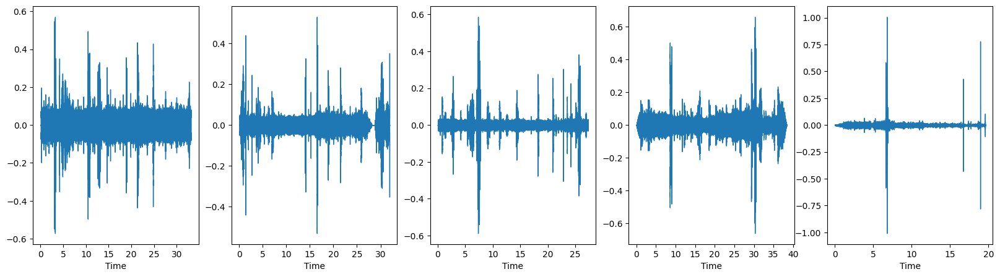

In [244]:
plt.figure(figsize=(20,5))
plt.subplot(1,5,1)
librosa.display.waveshow(a2_1, sr=sr2_1)
plt.subplot(1,5,2)
librosa.display.waveshow(a2_2,sr=sr2_2)
plt.subplot(1,5,3)
librosa.display.waveshow(a2_3,sr=sr2_3)
plt.subplot(1,5,4)
librosa.display.waveshow(a2_4,sr=sr2_4)
plt.subplot(1,5,5)
librosa.display.waveshow(a2_5,sr=sr2_5)

**MEL SPECTROGRAMS FOR AUDIOS WHICH WE WILL USE IN TRAINING**

Text(0.5, 1.0, 'Spectrogram of the audio of second bird')

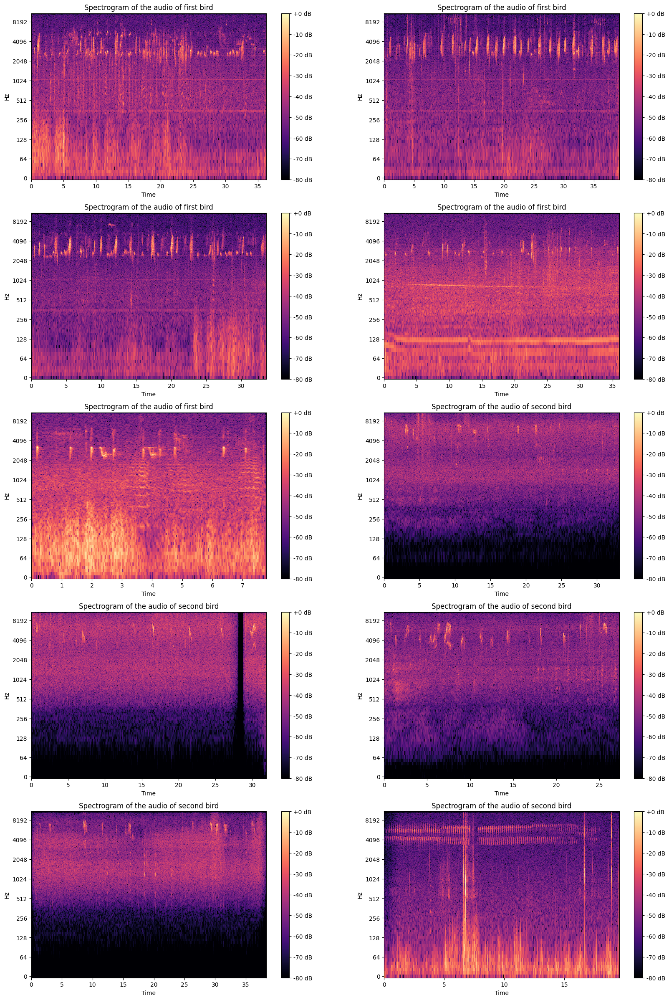

In [245]:
plt.figure(figsize=(20,30))
spec1 = librosa.amplitude_to_db(np.abs(librosa.stft(a1_1)), ref=np.max)
plt.subplot(5,2,1)
librosa.display.specshow(spec1, sr=sr1_1, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of the audio of first bird')

spec1 = librosa.amplitude_to_db(np.abs(librosa.stft(a1_2)), ref=np.max)
plt.subplot(5,2,2)
librosa.display.specshow(spec1, sr=sr1_2, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of the audio of first bird')

spec1 = librosa.amplitude_to_db(np.abs(librosa.stft(a1_3)), ref=np.max)
plt.subplot(5,2,3)
librosa.display.specshow(spec1, sr=sr1_3, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of the audio of first bird')

spec1 = librosa.amplitude_to_db(np.abs(librosa.stft(a1_4)), ref=np.max)
plt.subplot(5,2,4)
librosa.display.specshow(spec1, sr=sr1_4, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of the audio of first bird')

spec1 = librosa.amplitude_to_db(np.abs(librosa.stft(a1_5)), ref=np.max)
plt.subplot(5,2,5)
librosa.display.specshow(spec1, sr=sr1_5, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of the audio of first bird')

spec2 = librosa.amplitude_to_db(np.abs(librosa.stft(a2_1)), ref=np.max)
plt.subplot(5,2,6)
librosa.display.specshow(spec2, sr=sr2_1, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of the audio of second bird')


spec2 = librosa.amplitude_to_db(np.abs(librosa.stft(a2_2)), ref=np.max)
plt.subplot(5,2,7)
librosa.display.specshow(spec2, sr=sr2_2, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of the audio of second bird')


spec2 = librosa.amplitude_to_db(np.abs(librosa.stft(a2_3)), ref=np.max)
plt.subplot(5,2,8)
librosa.display.specshow(spec2, sr=sr2_3, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of the audio of second bird')


spec2 = librosa.amplitude_to_db(np.abs(librosa.stft(a2_4)), ref=np.max)
plt.subplot(5,2,9)
librosa.display.specshow(spec2, sr=sr2_4, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of the audio of second bird')


spec2 = librosa.amplitude_to_db(np.abs(librosa.stft(a2_5)), ref=np.max)
plt.subplot(5,2,10)
librosa.display.specshow(spec2, sr=sr2_5, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of the audio of second bird')

**MFCC**

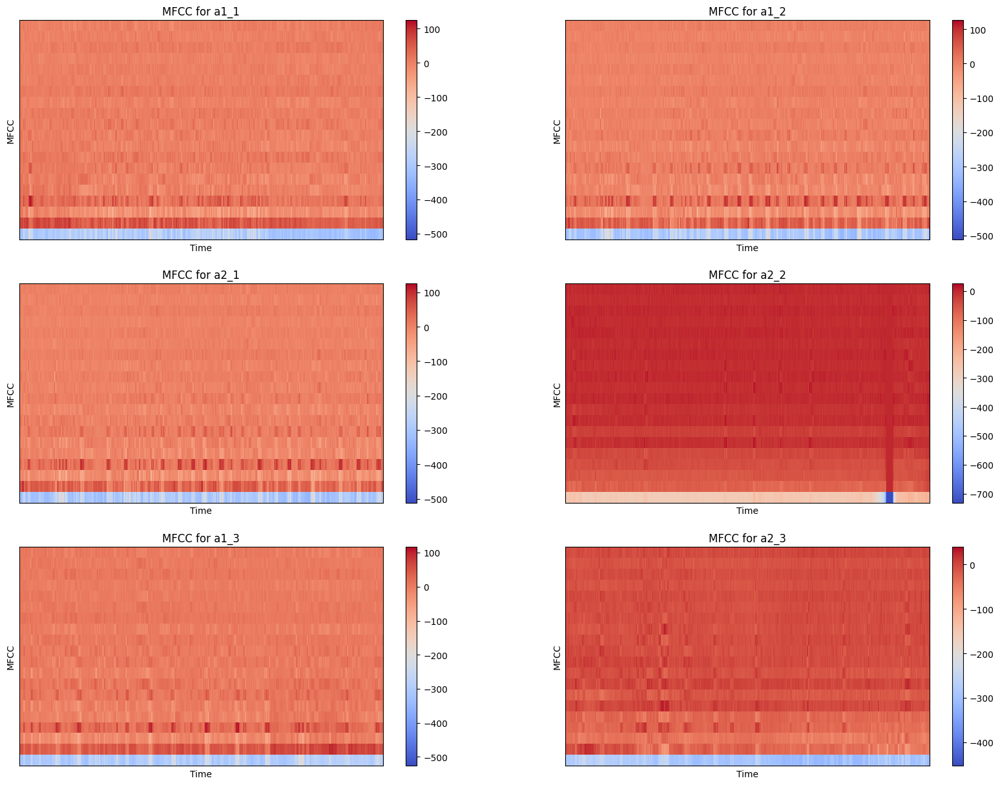

In [246]:
import matplotlib.pyplot as plt
import librosa.display

plt.figure(figsize=(20,15))

mfcc1 = librosa.feature.mfcc(y=a1_1, sr=sr1_1)
plt.subplot(3, 2, 1)
librosa.display.specshow(mfcc1)
plt.title('MFCC for a1_1')
plt.ylabel('MFCC')
plt.xlabel('Time')
plt.colorbar()

mfcc2 = librosa.feature.mfcc(y=a1_2, sr=sr1_2)
plt.subplot(3, 2, 2)
librosa.display.specshow(mfcc2)
plt.title('MFCC for a1_2')
plt.ylabel('MFCC')
plt.xlabel('Time')
plt.colorbar()

mfcc3 = librosa.feature.mfcc(y=a2_1, sr=sr2_1)
plt.subplot(3, 2, 3)
librosa.display.specshow(mfcc2)
plt.title('MFCC for a2_1')
plt.ylabel('MFCC')
plt.xlabel('Time')
plt.colorbar()

mfcc4 = librosa.feature.mfcc(y=a2_2, sr=sr2_2)
plt.subplot(3, 2, 4)
librosa.display.specshow(mfcc4)
plt.title('MFCC for a2_2')
plt.ylabel('MFCC')
plt.xlabel('Time')
plt.colorbar()

mfcc5 = librosa.feature.mfcc(y=a1_3, sr=sr1_3)
plt.subplot(3, 2, 5)
librosa.display.specshow(mfcc5)
plt.title('MFCC for a1_3')
plt.ylabel('MFCC')
plt.xlabel('Time')
plt.colorbar()

mfcc6 = librosa.feature.mfcc(y=a2_3, sr=sr2_3)
plt.subplot(3, 2, 6)
librosa.display.specshow(mfcc6)
plt.title('MFCC for a2_3')
plt.ylabel('MFCC')
plt.xlabel('Time')
plt.colorbar()

plt.show()


**MFCC-PLOTS**

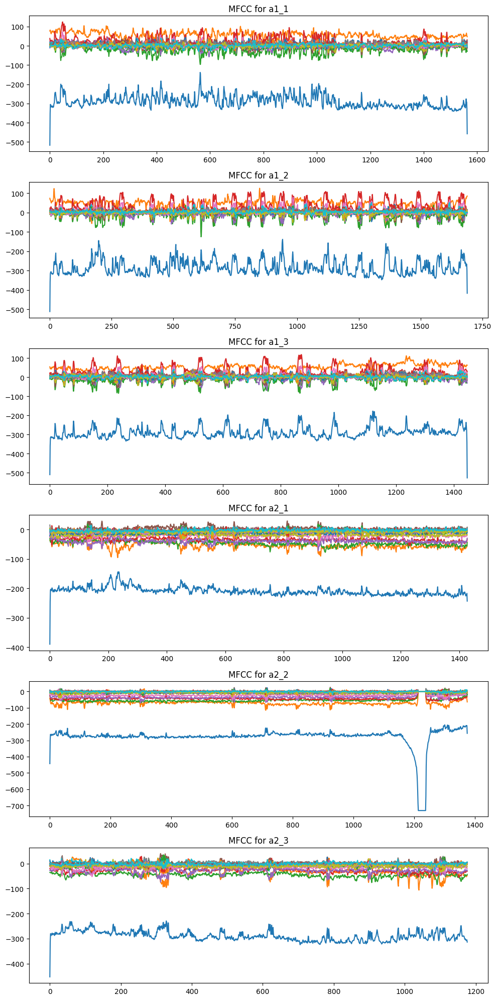

In [247]:
import matplotlib.pyplot as plt
import numpy as np


plt.figure(figsize=(10, 20))

plt.subplot(6, 1, 1)
for i in range(mfcc1.shape[0]):
    plt.plot(mfcc1[i], label=f'MFCC {i+1}')
plt.title('MFCC for a1_1')


plt.subplot(6, 1, 2)
for i in range(mfcc2.shape[0]):
    plt.plot(mfcc2[i], label=f'MFCC {i+1}')
plt.title('MFCC for a1_2')


plt.subplot(6, 1, 3)
for i in range(mfcc5.shape[0]):
    plt.plot(mfcc5[i], label=f'MFCC {i+1}')
plt.title('MFCC for a1_3')



plt.subplot(6, 1, 4)
for i in range(mfcc3.shape[0]):
    plt.plot(mfcc3[i], label=f'MFCC {i+1}')
plt.title('MFCC for a2_1')


plt.subplot(6, 1, 5)
for i in range(mfcc4.shape[0]):
    plt.plot(mfcc4[i], label=f'MFCC {i+1}')
plt.title('MFCC for a2_2')


plt.subplot(6, 1, 6)
for i in range(mfcc6.shape[0]):
    plt.plot(mfcc6[i], label=f'MFCC {i+1}')
plt.title('MFCC for a2_3')


plt.tight_layout()
plt.show()


**ZERO CROSSING RATES PLOTS**

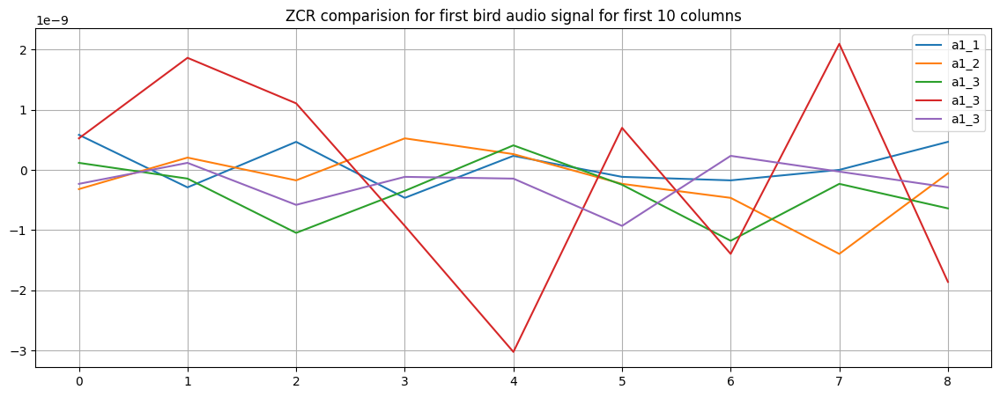

In [248]:
zcr7_1 = librosa.feature.zero_crossing_rate(a1_1)
zcr7_2 = librosa.feature.zero_crossing_rate(a1_2)
zcr7_3 = librosa.feature.zero_crossing_rate(a1_3)
zcr7_4 = librosa.feature.zero_crossing_rate(a1_4)
zcr7_5 = librosa.feature.zero_crossing_rate(a1_5)


n0 = 1
n1 = 10
plt.figure(figsize=(14, 5))
plt.plot(a1_1[n0:n1], label='a1_1')
plt.plot(a1_2[n0:n1], label='a1_2')
plt.plot(a1_3[n0:n1], label='a1_3')
plt.plot(a1_4[n0:n1], label='a1_3')
plt.plot(a1_5[n0:n1], label='a1_3')


plt.legend()
plt.title("ZCR comparision for first bird audio signal for first 10 columns")
plt.grid()

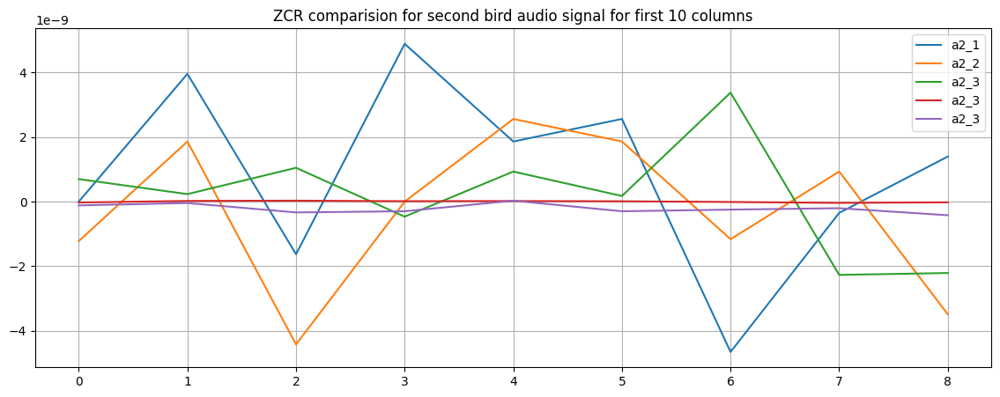

In [249]:
zcr2_1 = librosa.feature.zero_crossing_rate(a2_1)
zcr2_2 = librosa.feature.zero_crossing_rate(a2_2)
zcr2_3 = librosa.feature.zero_crossing_rate(a2_3)
zcr2_4 = librosa.feature.zero_crossing_rate(a2_4)
zcr2_5 = librosa.feature.zero_crossing_rate(a2_5)


n0 = 1
n1 = 10
plt.figure(figsize=(14, 5))
plt.plot(a2_1[n0:n1], label='a2_1')
plt.plot(a2_2[n0:n1], label='a2_2')
plt.plot(a2_3[n0:n1], label='a2_3')
plt.plot(a2_4[n0:n1], label='a2_3')
plt.plot(a2_5[n0:n1], label='a2_3')


plt.legend()
plt.title("ZCR comparision for second bird audio signal for first 10 columns")
plt.grid()